In [1]:
# Import packages
%matplotlib inline
import mpld3
mpld3.enable_notebook()
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from util import *
from filter_design import *
import scipy.signal as sgn
from ipywidgets import interact, interactive, fixed
from IPython.display import display

-------------------
# Filtrando Interferência Elétrica da Rede Elétrica

## FIltro Notch
*Nesta seção será ilustrado o projeto de um filtro notch para filtrar a frequência da rede elétrica.*

### Eletrocardiograma contaminado com ruído da rede
Abaixo está mostrado um trecho de um eletrocardiograma contaminado com ruído de 60 hz (e possívelmente alguns harmonicos) antes da aplicação do filtro de 60 Hz.

/usr/lib/python2.7/site-packages/IPython/core/formatters.py:92: DeprecationWarning: DisplayFormatter._ipython_display_formatter_default is deprecated: use @default decorator instead.
  def _ipython_display_formatter_default(self):
/usr/lib/python2.7/site-packages/IPython/core/formatters.py:669: DeprecationWarning: PlainTextFormatter._singleton_printers_default is deprecated: use @default decorator instead.
  def _singleton_printers_default(self):


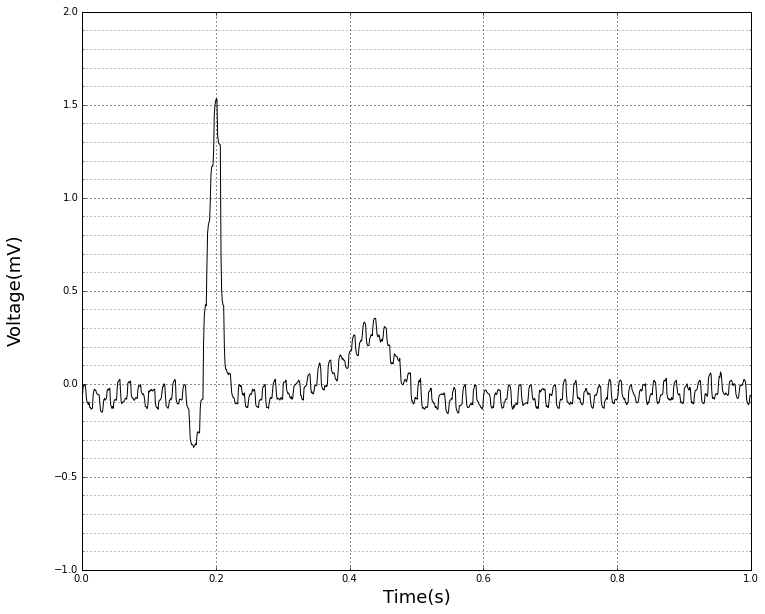

In [2]:
# Sample rate
fs = 1000.0 # Hz

# Get notch filter coeficients
b, a = notch_filter(fs, [60])

# get signal from txt (not from elsa database)
x = get_signal_txt("ecg_60hz.txt")
x = x[0:1000]
fs = 1000.0 #Hz

# plot signal
plot_signal(x, fs)

### Conteúdo espectral do eletrocardiograma
Abaixo está mostrado o conteúdo espectral do eletrocardiograma, note o pico em torno de $60 Hz$. Esse é o ruído gerado pela interferência da rede elétrica.

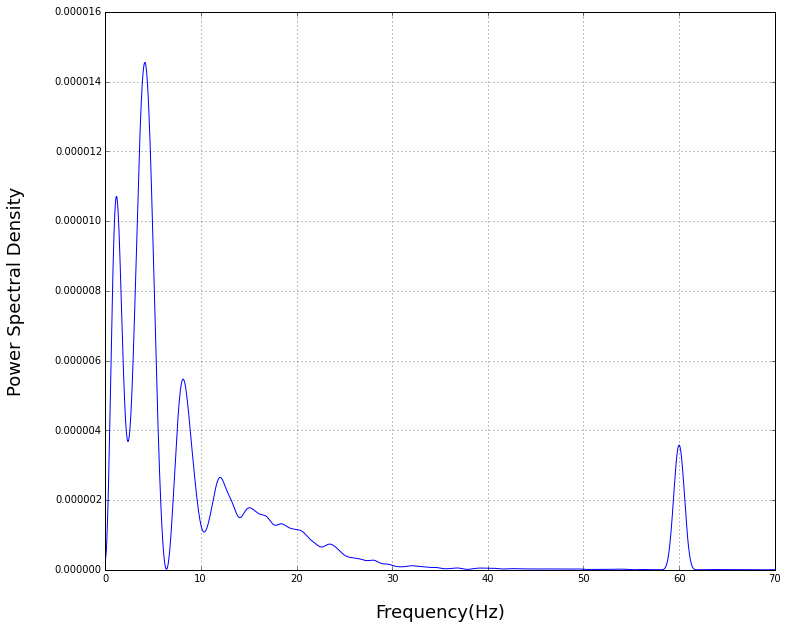

In [3]:
# plot fft
plot_fft(x, fs, xaxis=[0, 70])

### Sinal após a aplicação do filtro notch
Abaixo está mostrado o sinal após aplicado o filtro notch na frequência de 60 Hz.

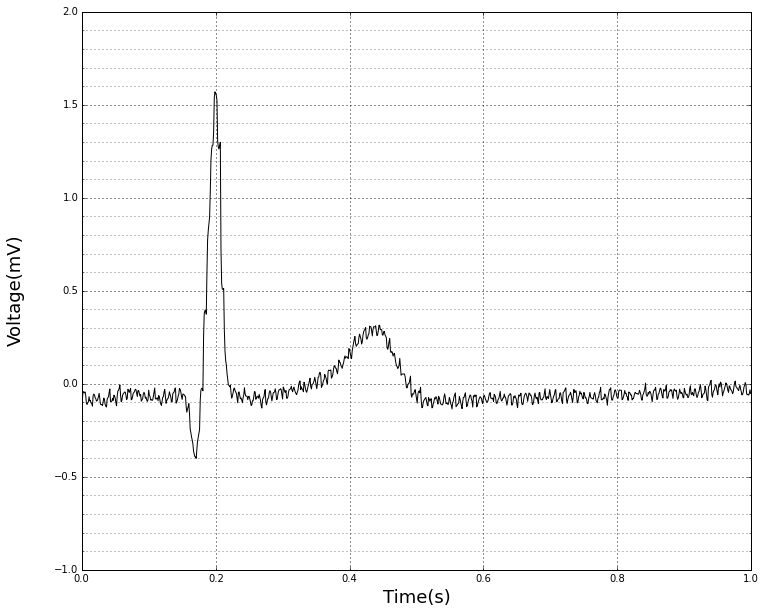

In [4]:
y = sgn.filtfilt(b, a, x)

# plot signal
plot_signal(y, fs)

### Conteúdo espectral após a aplicação do filtro
Abaixo está mostrado o conteúdo espectral do sinal após a aplicação do filtro. *Note que o pico em 60 Hz desapareceu*.

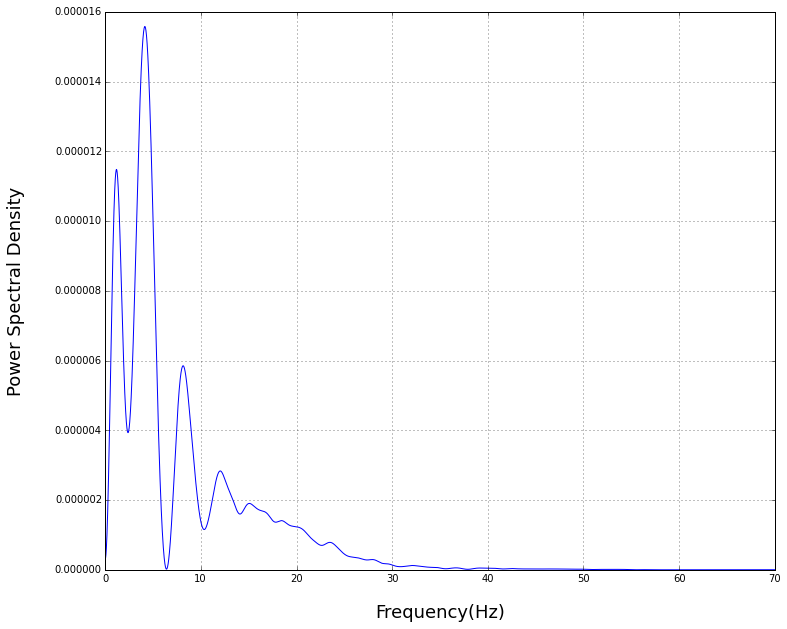

In [5]:
# plot fft
plot_fft(y, fs, xaxis=[0, 70])

### Resposta em frequência do filtro
A resposta em frequência desse filtro está mostrada a seguir. Note que em todos as frequências são mantidas
inalteradas, exceto a frequência de 60Hz, que é totalmente eliminada.

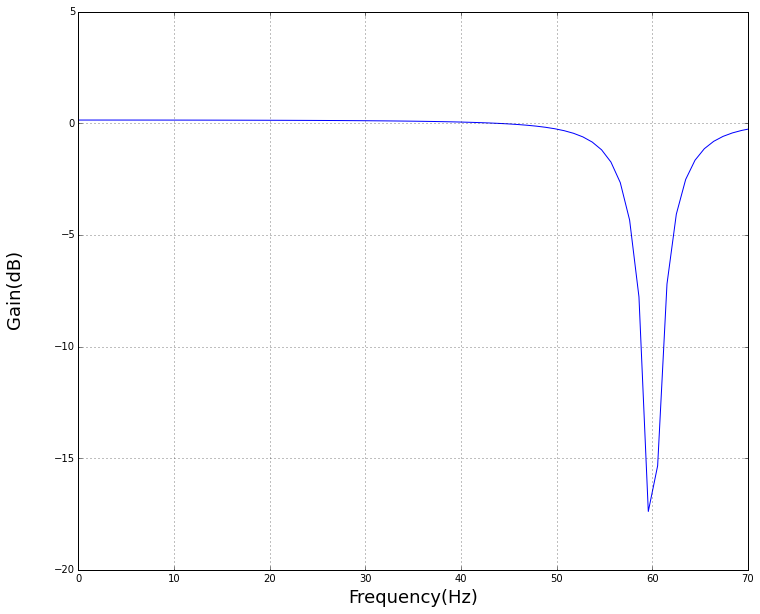

In [6]:
# Plot notch filter frequency response
plot_freq_respose(b, a, fs, xaxis=[0, 70])

------------------------
# Ruídos de Alta Frequência

Note que mesmo após retirar o ruído da rede elétrica ainda resta um ruído de alta frequência no sinal. Estudaremos nessa seção algumas formas para eliminar esse ruído de alta frequência.

## Filtro Passa Baixas
Utilizaremos um filtro de elíptico de alta ordem para filtrar as altas frequências. Abaixo está um procedimento 
iterativo para mostrar como é o resultado do filtro para diferentes frequências de corte.

1000.0


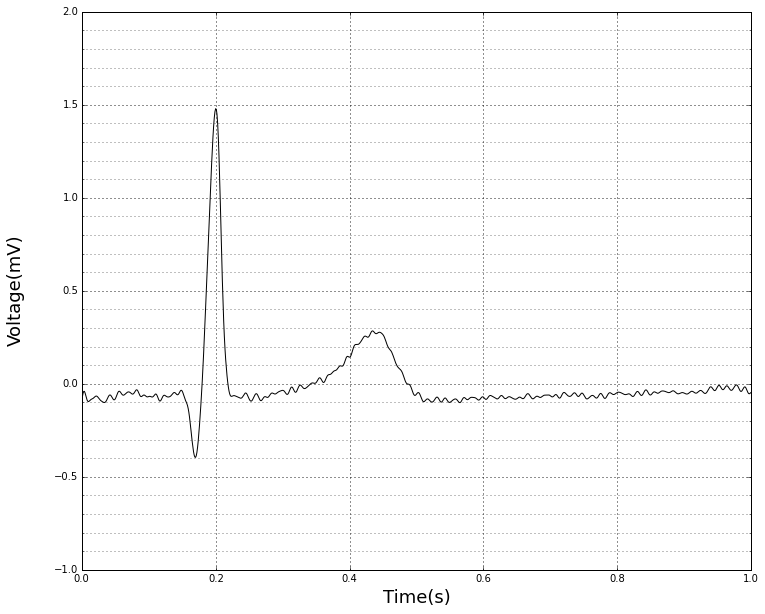

In [7]:

def h(filter60hz, fc):
    # get cutoff frequency
    wc = fc/(fs/2)
    # another filter caracteristics
    rp = 0.3
    rs = 100
    # Get eliptic coeficients
    b, a = sgn.ellip(12, rp, rs, wc)
    # Apply it to signal
    if filter60hz:
        z = sgn.filtfilt(b, a, y[0:1000])
    else:
        z = sgn.filtfilt(b, a, x[0:1000])
    # plot signal 
    plot_signal(z, fs)
    
    
interact(h, filter60hz=True, fc=(20.0,200.0,2), continuous_update=False)
print fs

--------------------
# Database do Elsa
O banco de dados do elsa realmente tem alguns eletrocardiogramas severamente corrompidos com ruído, apesar disso
eles não tem potência espectral significativa em $60 Hz$.

## Sinal corrompido com ruído

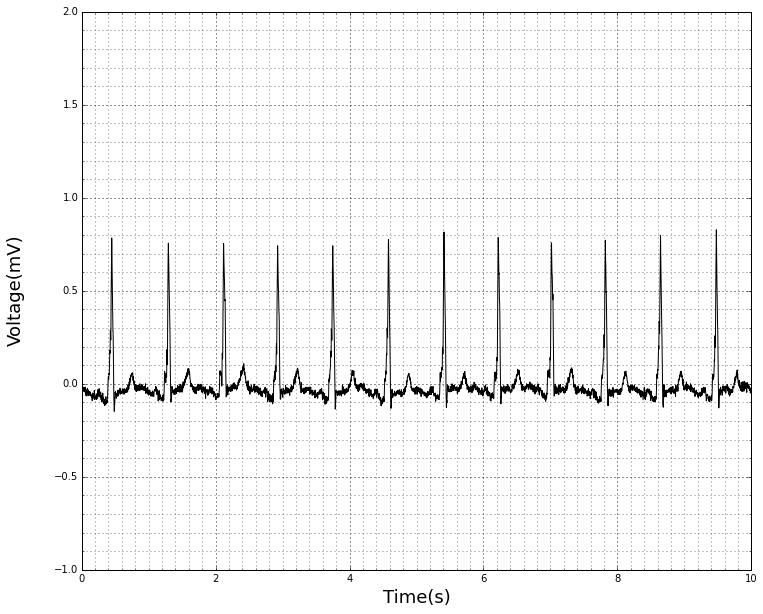

In [8]:
w, fsw = get_signal(5,3)
plot_signal(w, fsw)

## Conteúdo espectral
Note que não existe conteúdo espectral em $60 Hz$ sugerindo que esse ruído não é causado pela interação com a rede elétrica.

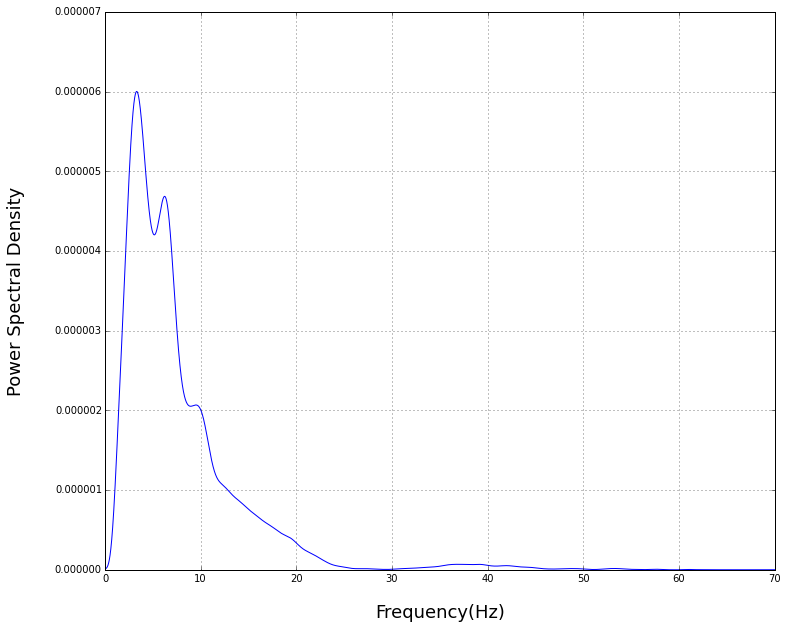

In [11]:
plot_fft(w[:500], fsw, xaxis=[0, 70])

### Efeito do filtro passa baixa

<function __main__.h>

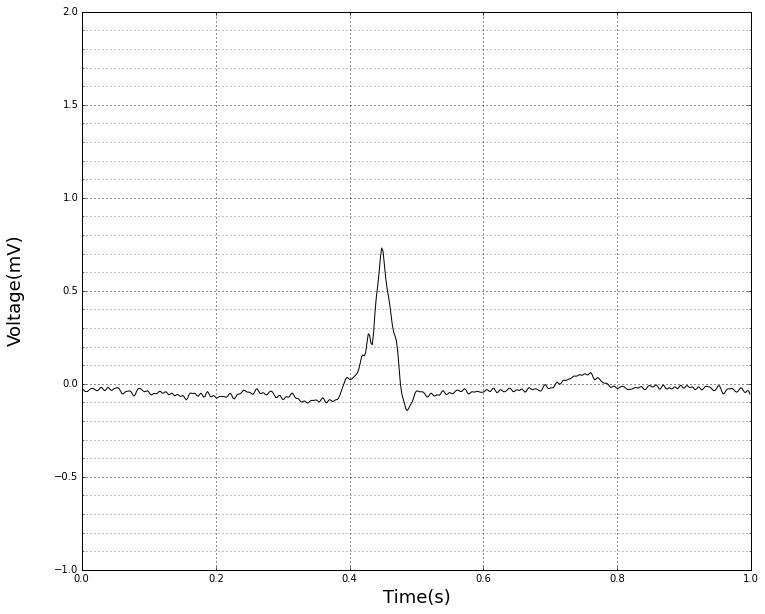

In [10]:
def h(fc):
    # get cutoff frequency
    wc = fc/(fsw/2)
    # another filter caracteristics
    rp = 0.3
    rs = 100
    # Get eliptic coeficients
    b, a = sgn.ellip(12, rp, rs, wc)
    z = sgn.filtfilt(b, a, w[:500])
    # plot signal 
    plot_signal(z, fsw)
    
interact(h, fc=(40.0,200.0,5), continuous_update=False)